In [1]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
import seaborn as sns
data = pd.read_csv('star_classification.csv')

# remove missing values
missing_values = data.isnull().sum()


# scale
scaler = StandardScaler()
scaled_features = scaler.fit_transform(data.drop(['obj_ID', 'class'], axis=1))
data

/Users/krishipatel/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,1.237661e+18,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,3606,301,2,79,6.543777e+18,GALAXY,0.634794,5812,56354,171
1,1.237665e+18,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,4518,301,5,119,1.176014e+19,GALAXY,0.779136,10445,58158,427
2,1.237661e+18,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,3606,301,2,120,5.152200e+18,GALAXY,0.644195,4576,55592,299
3,1.237663e+18,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,4192,301,3,214,1.030107e+19,GALAXY,0.932346,9149,58039,775
4,1.237680e+18,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,8102,301,3,137,6.891865e+18,GALAXY,0.116123,6121,56187,842
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,1.237679e+18,39.620709,-2.594074,22.16759,22.97586,21.90404,21.30548,20.73569,7778,301,2,581,1.055431e+19,GALAXY,0.000000,9374,57749,438
99996,1.237679e+18,29.493819,19.798874,22.69118,22.38628,20.45003,19.75759,19.41526,7917,301,1,289,8.586351e+18,GALAXY,0.404895,7626,56934,866
99997,1.237668e+18,224.587407,15.700707,21.16916,19.26997,18.20428,17.69034,17.35221,5314,301,4,308,3.112008e+18,GALAXY,0.143366,2764,54535,74
99998,1.237661e+18,212.268621,46.660365,25.35039,21.63757,19.91386,19.07254,18.62482,3650,301,4,131,7.601080e+18,GALAXY,0.455040,6751,56368,470


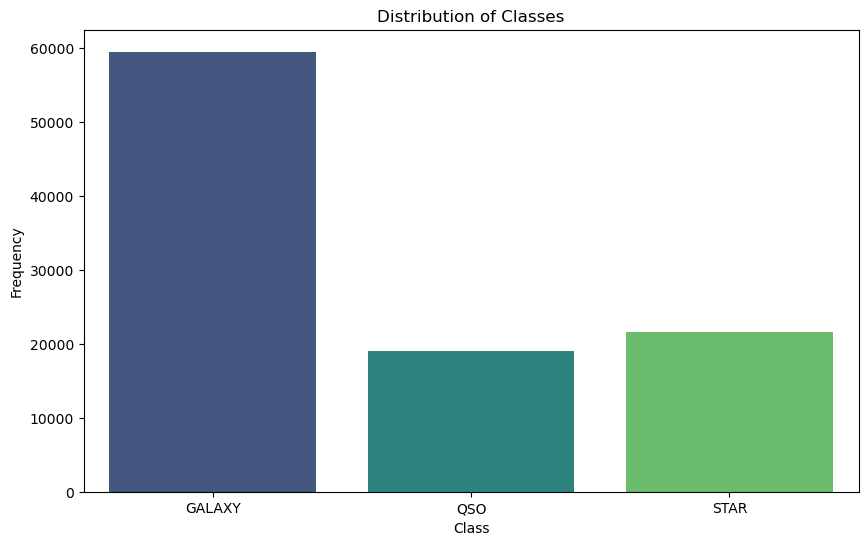

In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
sns.countplot(data=data, x='class', palette='viridis')
plt.title('Distribution of Classes')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.show()

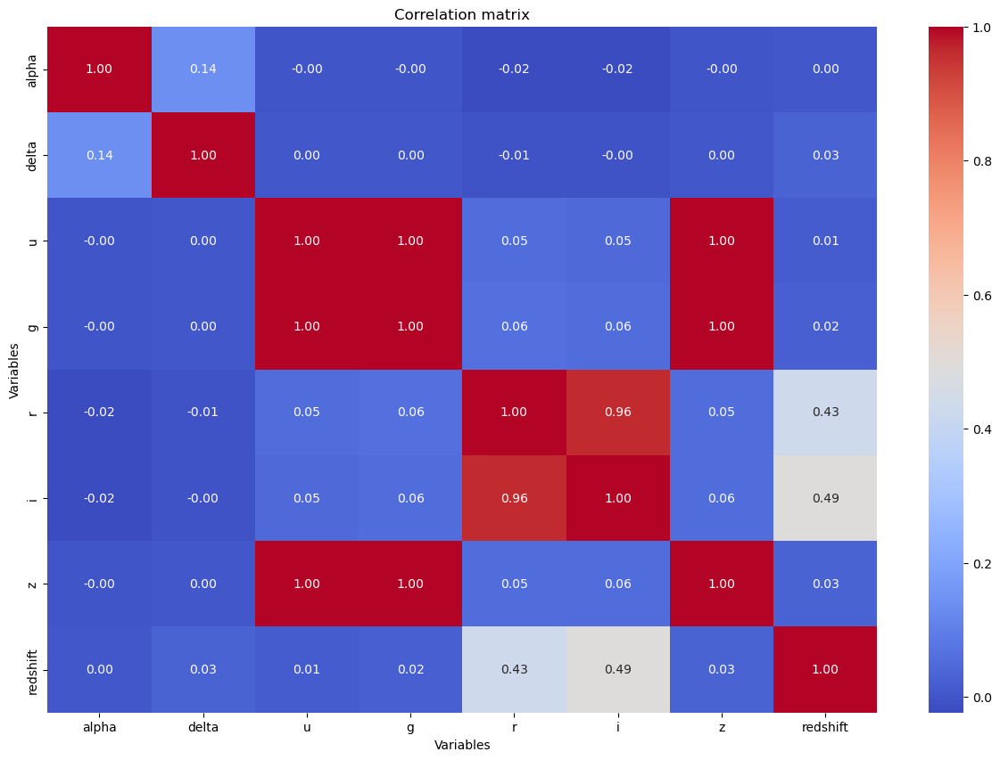

In [3]:
import seaborn as sns
import matplotlib.pyplot as plt

corr_data = data[['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'redshift']]

correlation_matrix = corr_data.corr()

correlation_matrix

plt.figure(figsize=(15, 10))

heatmap = sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)

plt.title('Correlation matrix')
plt.xlabel('Variables')
plt.ylabel('Variables')

# Show the heatmap
plt.show()

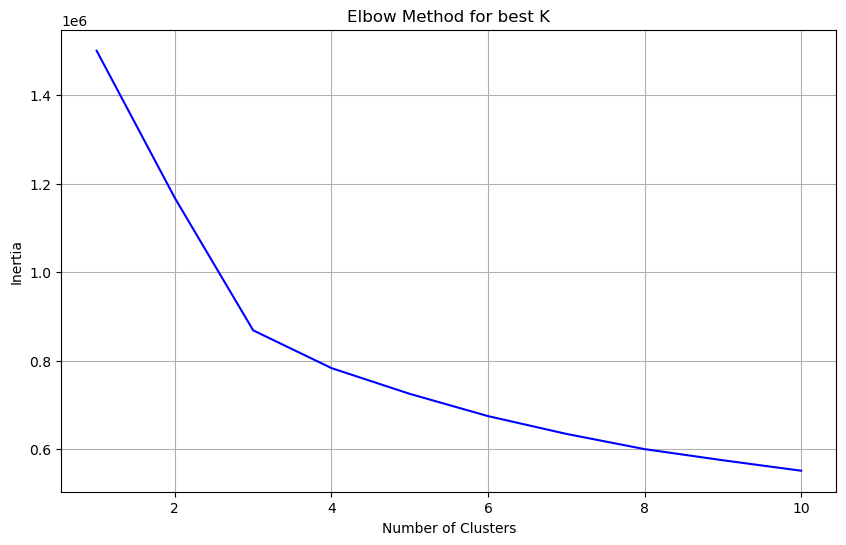

In [4]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# find optimal number of clusters
inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(scaled_features)
    inertia.append(kmeans.inertia_)

# graph curve
plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), inertia, linestyle='-', color='blue')
plt.title('Elbow Method for best K')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.grid(True)
plt.show()

In [5]:
kmeans = KMeans(n_clusters=3)
clusters = kmeans.fit_predict(scaled_features)

data['cluster'] = clusters

cluster_distribution = data['cluster'].value_counts()

data.head(), cluster_distribution

(         obj_ID       alpha      delta         u         g         r  \
 0  1.237661e+18  135.689107  32.494632  23.87882  22.27530  20.39501   
 1  1.237665e+18  144.826101  31.274185  24.77759  22.83188  22.58444   
 2  1.237661e+18  142.188790  35.582444  25.26307  22.66389  20.60976   
 3  1.237663e+18  338.741038  -0.402828  22.13682  23.77656  21.61162   
 4  1.237680e+18  345.282593  21.183866  19.43718  17.58028  16.49747   
 
           i         z  run_ID  rerun_ID  cam_col  field_ID   spec_obj_ID  \
 0  19.16573  18.79371    3606       301        2        79  6.543777e+18   
 1  21.16812  21.61427    4518       301        5       119  1.176014e+19   
 2  19.34857  18.94827    3606       301        2       120  5.152200e+18   
 3  20.50454  19.25010    4192       301        3       214  1.030107e+19   
 4  15.97711  15.54461    8102       301        3       137  6.891865e+18   
 
     class  redshift  plate    MJD  fiber_ID  cluster  
 0  GALAXY  0.634794   5812  56354      

In [6]:
# check the outlier
outlier = data[kmeans.labels_ == 2]

outlier

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID,cluster
79543,1.237649e+18,224.006526,-0.624304,-9999.0,-9999.0,18.1656,18.01675,-9999.0,752,301,2,537,3.731277e+18,STAR,0.000089,3314,54970,162,2


In [7]:
# remove outlier
cleaned_data = data.drop(outlier.index)

# remove cluster
cleaned_data = cleaned_data.drop(['cluster'], axis=1, errors='ignore')

scale = StandardScaler()
s_features_c = scale.fit_transform(cleaned_data.drop(['obj_ID', 'class'], axis=1))

# kmeans
kmeans_c = KMeans(n_clusters=3)
kmeans_c.fit(s_features_c)

# count
clusters = pd.Series(kmeans_c.labels_).value_counts().sort_index()

clusters

0    31055
1    28547
2    40397
dtype: int64

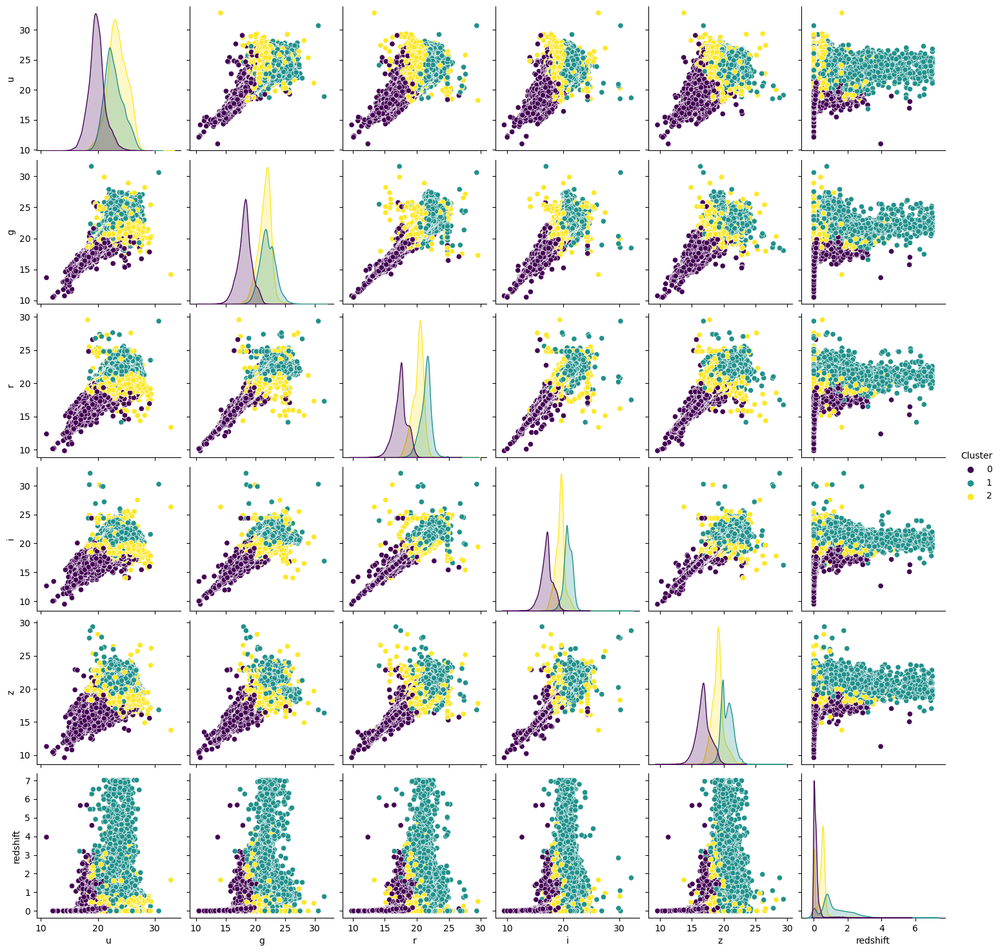

In [8]:
import seaborn as sns

# add clusters
cleaned_data['Cluster'] = kmeans_c.labels_

# features for the plot
f_plot = ['u', 'g', 'r', 'i', 'z', 'redshift', 'Cluster']

# plot
sns.pairplot(cleaned_data[f_plot], hue='Cluster', palette='viridis')
plt.show()

Cluster      0      1      2
class                       
GALAXY   18701  11731  29013
QSO       1669  14355   2937
STAR     10685   2461   8447


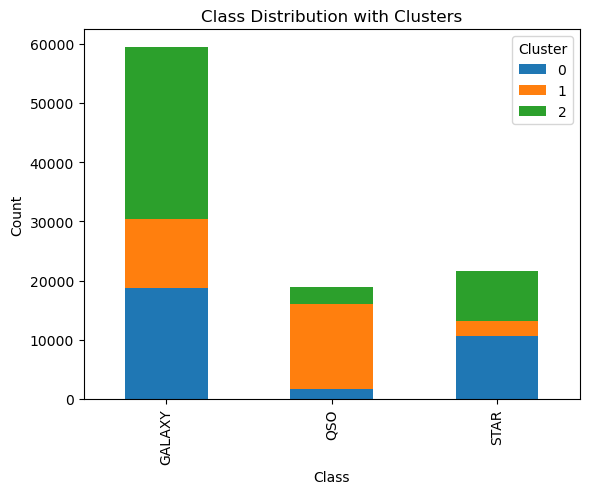

In [9]:
import seaborn as sns
import pandas as pd

cleaned_data['class'] = data['class']  
cleaned_data['Cluster'] = kmeans_c.labels_
class_cluster_ct = pd.crosstab(cleaned_data['class'], cleaned_data['Cluster'])

print(class_cluster_ct)

class_cluster_ct.plot(kind='bar', stacked=True)
plt.title('Class Distribution with Clusters')
plt.xlabel('Class')
plt.ylabel('Count')
plt.legend(title='Cluster')
plt.show()

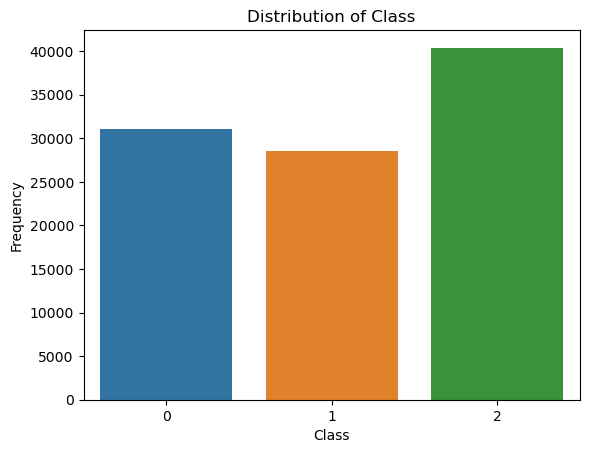

In [10]:
class_plot = cleaned_data['Cluster'].value_counts()
class_plot = sns.barplot(x=class_plot.index, y=class_plot.values)

class_plot.set_title('Distribution of Class')
class_plot.set_xlabel('Class')
class_plot.set_ylabel('Frequency')

plt.show()

In [11]:
import plotly.express as px

# make 3d plot
fig = px.scatter_3d(cleaned_data, x='u', y='g', z='r', color='Cluster',
                    title='Interactive 3D Scatter Plot of Clusters',
                    labels={'u': 'U Filter', 'g': 'G Filter', 'r': 'R Filter'},
                    color_continuous_scale=px.colors.qualitative.Bold)

fig.show()

In [12]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression

# x and y
X = cleaned_data[['alpha', 'delta', 'u', 'g', 'r', 'i', 'z']]
y = cleaned_data['redshift']

# split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25)


scaler = StandardScaler()
X_train_s = scaler.fit_transform(X_train)
X_test_s = scaler.transform(X_test)

regressor = LinearRegression()
regressor.fit(X_train_s, y_train)

# predict
y_pred = regressor.predict(X_test_s)

# performace
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)

r2, mse

(0.28064653738220946, 0.37969394813474083)